<a href="https://colab.research.google.com/github/patjiang/ASICS-noise/blob/master/vae/Train_VAEv4.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
#@title Install Dependencies, data, load data.
%%time
import os
from data import *
import requests
import zipfile
os.system('pip install opencv-python matplotlib')

url = "https://huggingface.co/datasets/phjiang/ARED-GROUP/resolve/main/ared_datap1.zip"
file_name = url.split("/")[-1].split('?')[0]
download_dir = "downloads"
extracted_dir = "ared_data"

os.makedirs(download_dir, exist_ok=True)
os.makedirs(extracted_dir, exist_ok=True)

download_command = f"wget {url} -O {os.path.join(download_dir, file_name)}"
os.system(download_command)
print(f"Downloaded {file_name} to {download_dir}.")

unzip_command = f"unzip {os.path.join(download_dir, file_name)} -d {extracted_dir}"
os.system(unzip_command)

print(f"Extracted files to {extracted_dir}.")

with open('./ared_data/ared_data/data.yaml', 'r') as f:
  content = f.read()

content = content.replace('1', 'sitting')
content = content.replace('2', 'standing')
content = content.replace('3', 'seatbelt')

with open('./ared_data/ared_data/data.yaml', 'w') as file:
  file.write(content)


root_dir = "ared_data/ared_data"
data_yaml_path = os.path.join(root_dir, "data.yaml")
redistribute_and_balance(root_dir, data_yaml_path, split_ratios=(0.7, 0.2, 0.1), tolerance=0.01)

Downloaded ared_datap1.zip to downloads.
Extracted files to ared_data.
Balanced achieved at iteration 1, diff = 0.0013, class = Violence
CPU times: user 2.1 s, sys: 5.69 s, total: 7.79 s
Wall time: 3min 20s


--- Mosaic Dataset Test ---
Mosaic Dataset created successfully! Len: 12920
Sample Mosaic Image Tensor Shape: torch.Size([3, 640, 640])
Sample Mosaic Boxes Tensor Shape: torch.Size([1, 5])
Mosaic Item 0: Image shape: torch.Size([3, 640, 640]), Boxes shape: torch.Size([1, 5])
Mosaic Item 1: Image shape: torch.Size([3, 640, 640]), Boxes shape: torch.Size([1, 5])
Mosaic Item 2: Image shape: torch.Size([3, 640, 640]), Boxes shape: torch.Size([1, 5])
Mosaic Item 3: Image shape: torch.Size([3, 640, 640]), Boxes shape: torch.Size([1, 5])
Mosaic Item 4: Image shape: torch.Size([3, 640, 640]), Boxes shape: torch.Size([1, 5])
Mosaic Item 5: Image shape: torch.Size([3, 640, 640]), Boxes shape: torch.Size([1, 5])
Mosaic Item 6: Image shape: torch.Size([3, 640, 640]), Boxes shape: torch.Size([1, 5])
Mosaic Item 7: Image shape: torch.Size([3, 640, 640]), Boxes shape: torch.Size([1, 5])
Mosaic Item 8: Image shape: torch.Size([3, 640, 640]), Boxes shape: torch.Size([26, 5])
Mosaic Item 9: Image shape:

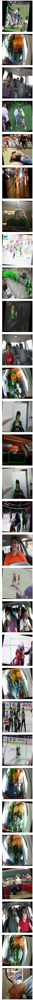

CPU times: user 10.8 s, sys: 1.55 s, total: 12.3 s
Wall time: 11.7 s


In [6]:
#@title test-display images
%%time
from utils import *
import os
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from matplotlib.patches import Polygon
import numpy as np
import torchvision.transforms.functional as TF

root_directory = "/content/"
data_yaml_path = "ared_data/ared_data/data.yaml"

print("--- Mosaic Dataset Test ---")

mosaic_dataset = MosaicDataset(root_directory, data_yaml_path, aug=True, num_mosaic_images=1)

print(f"Mosaic Dataset created successfully! Len: {len(mosaic_dataset)}")
sample_image_mosaic, sample_boxes_mosaic = mosaic_dataset[0]
print("Sample Mosaic Image Tensor Shape:", sample_image_mosaic.shape)
print("Sample Mosaic Boxes Tensor Shape:", sample_boxes_mosaic.shape)

num_samples=30
fig, axs = plt.subplots(nrows=num_samples, figsize=(8, 5 * num_samples))
if num_samples == 1:
  axs = [axs]

for i in range(num_samples):
  image, boxes_xyxy = mosaic_dataset[i]
  print(f"Mosaic Item {i}: Image shape: {image.shape}, Boxes shape: {boxes_xyxy.shape}")
  C, H, W = image.shape

  yolo_boxes = []
  for x_min, y_min, x_max, y_max, cls in boxes_xyxy:
    cx = (x_min + x_max) * 0.5 / W
    cy = (y_min + y_max) * 0.5 / H
    bw = (x_max - x_min) / W
    bh = (y_max - y_min) / H
    yolo_boxes.append([int(cls), cx.item(), cy.item(), bw.item(), bh.item()])

  rotated_img, rotated_boxes = random_rotate(image, yolo_boxes, angle_range=(-10, 10))

  rot_np = rotated_img.permute(1, 2, 0).cpu().numpy().clip(0, 1)
  axs[i].imshow(rot_np)
  axs[i].axis("off")

  for box in rotated_boxes:
    cls, cx, cy, bw, bh = box
    x_min = (cx - bw / 2) * W
    y_min = (cy - bh / 2) * H
    x_max = (cx + bw / 2) * W
    y_max = (cy + bh / 2) * H

    pts = torch.tensor([[x_min, y_min], [x_max, y_min], [x_max, y_max], [x_min, y_max]])
    pts = pts.cpu().numpy()
    poly = Polygon(pts, closed=True, linewidth=2, edgecolor='lime', facecolor='none')
    axs[i].add_patch(poly)
    axs[i].text(x_min, y_min - 5, str(int(cls)), color='lime', fontsize=10, weight='bold')

plt.tight_layout()
plt.show()


In [7]:
#@title Initialize VAE functions and model

%%time
import torch
import torch.nn as nn
import random
import cv2
import numpy as np
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
from tqdm import tqdm
from utils import MosaicDataset
import torch.nn.functional as F
import matplotlib.patches as patches
from sklearn.manifold import TSNE
import typing
import math

def kl_divergence(mu, logvar):
    """Calculates the KL divergence between two diagonal Gaussian distributions."""
    return -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp(), dim=-1).mean()

def label_smoothed_cross_entropy(pred_logits, target, smoothing=0.1):
    """Calculates label-smoothed cross-entropy loss."""
    num_classes = pred_logits.size(1)
    log_probs = F.log_softmax(pred_logits, dim=1)
    with torch.no_grad():
        true_dist = torch.zeros_like(pred_logits)
        true_dist.fill_(smoothing / (num_classes - 1))
        true_dist.scatter_(1, target.unsqueeze(1), 1 - smoothing)
    return torch.mean(torch.sum(-true_dist * log_probs, dim=1))

def smooth_l1_loss(input, target):
    """Calculates Smooth L1 loss."""
    return F.smooth_l1_loss(input, target, reduction='sum')

class FiniteScalarQuantizer(nn.Module):
    """Finite Scalar Quantizer (FSQ) module as initially provided."""
    def __init__(self, levels: typing.List[int], inp_size, dev):
        super().__init__()
        self.levels = torch.tensor(levels)
        self.basis = torch.cat([torch.tensor([1]), torch.cumprod(self.levels[:-1], dim=0)]).to(dtype=torch.int32)
        self.num_dims = len(levels)
        self.size = torch.prod(self.levels)
        self.dev = dev

    def codebook(self):
        return self.i_to_c(torch.arange(self.size).to(self.dev))

    def round_stderr(self, z):
        zhat = torch.round(z)
        return z + (zhat - z).detach()

    def bound(self, z, eps=1e-3):
        levels = self.levels.to(self.dev)
        half_l = (levels-1) * (1-eps) / 2
        offset = torch.where(levels%2 == 1, 0.0, 0.5)
        shift = torch.tan(offset / half_l)
        return torch.tanh(z + shift) * half_l - offset

    def quantize(self, z):
        quantized = self.round_stderr(self.bound(z))
        half_width = (self.levels // 2).to(self.dev)
        return quantized / half_width

    def _scale_shift(self, norm):
        levels = self.levels.to(norm.device)
        half_width = levels // 2
        return (norm * half_width) + half_width

    def _scale_shift_inv(self, norm):
        levels = self.levels.to(self.dev)
        half_width = levels // 2
        return (norm - half_width) / half_width

    def c_to_i(self, zhat):
        basis = self.basis.to(zhat.device)
        zhat = self._scale_shift(zhat)
        return (zhat * basis).sum(axis=-1).to(dtype=torch.int32)

    def i_to_c(self, idx):
        idx = idx.unsqueeze(-1)
        basis = self.basis.to(idx.device)
        levels = self.levels.to(idx.device)
        codes = torch.remainder(torch.floor_divide(idx, basis), levels)
        return self._scale_shift_inv(codes)

def get_level_from_latent(n):
    """Provides FSQ levels based on the latent dimension scale (log2(n))."""
    if n <= 0:
         raise Exception(f"Latent dimension scale must be positive, got {n}.")
    eva = int(torch.log2(torch.tensor(float(n))).item())
    levels = {8: [8, 6, 5], 10: [8, 5, 5, 5], 11: [7, 5, 5, 5, 5],
              12:[7, 5, 5, 5, 5], 14: [8, 8, 8, 6, 5],
              16: [8, 8, 8, 5, 5, 5]}
    if eva in levels:
        return levels[eva]
    else:
        keys = sorted(levels.keys())
        if eva < keys[0]:
            raise Exception(f"Latent dimension scale (log2={eva}) is too small. Smallest supported log2 is {keys[0]}.")
        elif eva > keys[-1]:
             raise Exception(f"Latent dimension scale (log2={eva}) is too large. Largest supported log2 is {keys[-1]}.")
        else:
            raise Exception(f"Latent dimension scale (log2={eva}) not explicitly defined in levels mapping.")

class BBoxVAE(nn.Module):
    """Variational Autoencoder for Bounding Box Prediction with optional FSQ flow."""
    def __init__(self, latent_dim=2048, num_classes=15, max_boxes=10, use_fsq=True, device='cuda', encoder_output_spatial_size=(1, 1)):
        """
        Args:
            latent_dim (int): The dimension of the VAE's continuous latent space
                              and the dimension used by the FSQ flow. Expected to be 2048.
            num_classes (int): Number of object classes.
            max_boxes (int): Maximum number of boxes the decoder can predict.
            use_fsq (bool): Whether to use the FSQ flow.
            device (str or torch.device): The device.
            encoder_output_spatial_size (tuple): Target spatial size after adaptive pooling.
        """
        super(BBoxVAE, self).__init__()
        self.latent_dim = latent_dim
        self.num_classes = num_classes
        self.max_boxes = max_boxes
        self.use_fsq = use_fsq
        self.device = device
        self.encoder_output_spatial_size = encoder_output_spatial_size

        self.intermediate_dim_down = 2040
        self.num_chunks = self.intermediate_dim_down // 5
        self.intermediate_dim_up = 2040

        if latent_dim != 2048 or self.intermediate_dim_down % 5 != 0:
             print(f"Warning: Proposed FSQ flow is designed for latent_dim=2048 and 2040 // 5. Received latent_dim={latent_dim}.")
             self.use_fsq = False


        self.encoder_conv = nn.Sequential(
            nn.InstanceNorm2d(3),
            nn.Conv2d(3, 4, kernel_size=5, stride=4, padding=0),
            nn.ReLU(),
            nn.Conv2d(4, 8, kernel_size=4, stride=3, padding=0),
            nn.ReLU(),
            nn.Conv2d(8, 16, kernel_size=4, stride=3, padding=0),
            nn.ReLU(),
            nn.Conv2d(16, 32, kernel_size=3, stride=2, padding=0),
            nn.ReLU()
        )

        self.adaptive_pool = nn.AdaptiveAvgPool2d(encoder_output_spatial_size)

        encoder_last_conv_channels = 32
        self.flat_dim = encoder_last_conv_channels * encoder_output_spatial_size[0] * encoder_output_spatial_size[1]

        self.fc_mu = nn.Linear(self.flat_dim, latent_dim)
        self.fc_logvar = nn.Linear(self.flat_dim, latent_dim)

        self.fsq_linear_down = None
        self.fsq_linear_up = None
        self.fsq = None

        if self.use_fsq:
             try:
                 self.fsq_linear_down = nn.Linear(self.latent_dim, self.intermediate_dim_down)

                 self.fsq_levels = get_level_from_latent(2048)
                 fsq_expected_dim = len(self.fsq_levels)

                 if fsq_expected_dim != 5:
                      print(f"Error: FSQ levels for 2048 scale resulted in dimension {fsq_expected_dim}, but flow expects 5-dim chunks. Disabling FSQ.")
                      self.use_fsq = False
                      self.fsq_linear_down = None
                 else:
                      self.fsq = FiniteScalarQuantizer(
                           levels=self.fsq_levels,
                           inp_size=(self.num_chunks, 5),
                           dev=device
                      ).to(device)
                      self.fsq_linear_up = nn.Linear(self.intermediate_dim_up, self.latent_dim)
                      print(f"FSQ flow initialized. FSQ levels: {self.fsq_levels}")

             except Exception as e:
                 print(f"Warning: Error initializing FSQ flow layers - {e}. FSQ will be disabled.")
                 self.fsq_linear_down = None
                 self.fsq_linear_up = None
                 self.fsq = None
                 self.use_fsq = False

        decoder_input_dim = self.latent_dim
        decoder_hidden_dim = decoder_input_dim * 2 if decoder_input_dim < 512 else 1024
        if decoder_hidden_dim < decoder_input_dim: decoder_hidden_dim = decoder_input_dim

        self.decoder_boxes = nn.Sequential(
            nn.Linear(decoder_input_dim, decoder_hidden_dim),
            nn.ReLU(),
            nn.Linear(decoder_hidden_dim, max_boxes * (5 + num_classes))
        )

    def reparameterize(self, mu, logvar):
        """Applies reparameterization and optional FSQ flow."""
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        z_continuous = mu + eps * std

        z = z_continuous

        if self.use_fsq and self.fsq is not None and self.fsq_linear_down is not None and self.fsq_linear_up is not None:
             batch_size = z.size(0)
             z = self.fsq_linear_down(z)
             z = z.view(batch_size, self.num_chunks, 5)
             z = self.fsq.quantize(z)
             z = z.view(batch_size, self.intermediate_dim_up)
             z = self.fsq_linear_up(z)

        return z

    def forward(self, x):
        """Forward pass."""
        batch_size = x.size(0)

        conv_out = self.encoder_conv(x)
        pooled_out = self.adaptive_pool(conv_out)
        flat = pooled_out.view(batch_size, -1)

        mu = self.fc_mu(flat)
        logvar = self.fc_logvar(flat)

        z = self.reparameterize(mu, logvar)

        boxes_out = self.decoder_boxes(z)
        boxes_out = boxes_out.reshape(batch_size, self.max_boxes, 5 + self.num_classes)

        return boxes_out, mu, logvar


def custom_collate(batch):
    images, boxes = zip(*batch)
    images = torch.stack(images, 0)
    padded_boxes = []
    for b in boxes:
        if b.size(0) < max_boxes:
            pad = torch.zeros(max_boxes - b.size(0), 5)
            padded_boxes.append(torch.cat([b, pad], dim=0))
        else:
            padded_boxes.append(b[:max_boxes])
    padded_boxes = torch.stack(padded_boxes, 0)
    return images, padded_boxes


from sklearn.metrics import adjusted_mutual_info_score
from sklearn.cluster import KMeans
import numpy as np
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
import torch
import torch.nn.functional as F
import matplotlib.patches as patches
import random
from torch.utils.data import DataLoader

def plot_latent_space(model, dataset, num_batches_to_plot=5):
  model.eval()
  all_z = []
  all_classes = []
  dataloader = DataLoader(dataset, batch_size=16, shuffle=False, collate_fn=custom_collate, num_workers=2, pin_memory=True)
  print(f"Plotting latent space for {min(num_batches_to_plot, len(dataloader))} batches...")

  with torch.no_grad():
      for batch_idx, (images, boxes) in enumerate(dataloader):
          if batch_idx >= num_batches_to_plot:
              break

          images = images.to(model.device, memory_format=torch.channels_last)
          boxes = boxes.to(model.device)

          boxes_pred, mu, logvar = model(images)
          z = model.reparameterize(mu, logvar)

          for i in range(z.size(0)):

              sample_boxes = boxes[i]
              class_ids = sample_boxes[:, 4]

              valid_class_ids = class_ids[class_ids > 0]

              if len(valid_class_ids) > 0:
                  rep_class = torch.mode(valid_class_ids).values.item()
              else:
                  rep_class = -1

              all_z.append(z[i].cpu().numpy())
              all_classes.append(rep_class)

  all_z = np.array(all_z)
  all_classes = np.array(all_classes)

  valid_mask = all_classes != -1
  z_filtered = all_z[valid_mask]
  labels_filtered = all_classes[valid_mask]

  print(f"Collected {len(z_filtered)} samples with valid class labels for t-SNE.")

  if len(z_filtered) < 2 or len(np.unique(labels_filtered)) < 2:
      print("Insufficient data or classes (less than 2) to perform t-SNE and AMI. Skipping.")
      plt.close('all')
      return

  print("Performing t-SNE...")
  tsne = TSNE(n_components=2, random_state=42, perplexity=min(30, len(z_filtered) - 1))
  z_2d = tsne.fit_transform(z_filtered)
  print("t-SNE complete.")

  unique_classes = np.unique(labels_filtered)
  n_clusters = len(unique_classes)
  print(f"Performing KMeans clustering with {n_clusters} clusters...")
  if n_clusters > 0:
      kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=15)
      cluster_labels = kmeans.fit_predict(z_filtered)
      print("KMeans complete.")
      ami_score = adjusted_mutual_info_score(labels_filtered, cluster_labels)
      print(f"Adjusted Mutual Information (AMI) score: {ami_score:.4f}")
  else:
        print("Cannot calculate AMI: No unique classes found in filtered labels.")
        ami_score = None


  plt.figure(figsize=(12, 10))
  scatter = plt.scatter(z_2d[:, 0], z_2d[:, 1], c=labels_filtered, cmap='tab20', alpha=0.8, s=20)

  legend1 = plt.legend(*scatter.legend_elements(),
                          loc="lower left", title="Classes")
  plt.gca().add_artist(legend1)


  fsq_status = "FSQ Enabled" if model.use_fsq else "No FSQ"
  title = f"Latent Space (t-SNE of z) — {fsq_status}"
  if ami_score is not None:
      title += f"\nAMI: {ami_score:.4f}"
  plt.title(title, fontsize=14)
  plt.xlabel("t-SNE Dim 1")
  plt.ylabel("t-SNE Dim 2")
  plt.grid(True)
  plt.tight_layout()
  plt.show()
  plt.close()

def draw_boxes(ax, image, gt_boxes=None, pred_boxes=None,
               num_classes=15, conf_thresh=0.1, normalized=True):
  """
  Draws both ground truth and predicted boxes on the same image axis.
  If normalized=True, x,y,w,h are assumed to be within [0,1].
  GT format: [x, y, w, h, cls_id] (normalized or not)
  Pred format: [obj_score_logit, x1, y1, x2, y2, cls_logits...] (normalized or not, after VAE decoder)
  """
  img_to_show = np.transpose(image, (1, 2, 0))

  ax.clear()
  ax.imshow(img_to_show.astype(np.float32))
  ax.axis('off')

  if isinstance(image, torch.Tensor):
    _, h_img, w_img = image.shape
  else:
    _, h_img, w_img = image.shape


  ax.set_xlim([0, w_img])
  ax.set_ylim([h_img, 0])
  ax.set_aspect('equal', adjustable='box')

  # ---------------
  # Draw GT boxes
  # ---------------
  print("\n--- Drawing GT Boxes ---")
  if gt_boxes is not None:
    print(f"Received {len(gt_boxes)} potential GT boxes.")
    drawn_gt_count = 0
    for i, box in enumerate(gt_boxes):
      if not isinstance(box, (torch.Tensor, np.ndarray)) or len(box) < 5:
        continue

      box_np = box.cpu().numpy() if isinstance(box, torch.Tensor) else box

      print(f"GT Box {i}: Coords = {box_np[:4].tolist()}")
      is_padded = np.all(box_np[:4] == 0)
      print(f"GT Box {i}: Is padded? {is_padded}")

      if is_padded:
        print(f"GT Box {i}: Identified as padded. Skipping.")
        continue

      x, y, bw, bh, cls_id_raw = box_np[:5]
      cls_id = int(cls_id_raw)

      print(f"GT Box {i}: Raw [x, y, w, h, cls_id] = [{x}, {y}, {bw}, {bh}, {cls_id}]")
      print(f"GT Box {i}: Image dimensions [w, h] = [{w_img}, {h_img}]")


      if bw <= 0 or bh <= 0:
        print(f"GT Box {i}: Invalid dimensions (w={bw}, h={bh}). Skipping.")
        continue

      if normalized:
        x1_scaled = x * w_img
        y1_scaled = y * h_img
        w_box_scaled = bw * w_img
        h_box_scaled = bh * h_img
      else:
        x1_scaled = x
        y1_scaled = y
        w_box_scaled = bw
        h_box_scaled = bh

      print(f"GT Box {i}: Scaled [x1, y1, w, h] = [{x1_scaled}, {y1_scaled}, {w_box_scaled}, {h_box_scaled}]")


      rect = patches.Rectangle((x1_scaled, y1_scaled), w_box_scaled, h_box_scaled,
                                linewidth=1.5, edgecolor='lime', facecolor='none')
      ax.add_patch(rect)

      label_x = max(0.0, x1_scaled + 2)
      label_y = max(8.0, y1_scaled + 10)

      label_x = min(label_x, w_img - 40)
      label_y = min(label_y, h_img - 5)

      ax.text(label_x, label_y,
              f"GT:{cls_id}",
              color='lime', fontsize=8, backgroundcolor='black')
      drawn_gt_count += 1
      print(f"GT Box {i}: Drawn.")

    print(f"Finished drawing GT boxes. Total drawn: {drawn_gt_count}")
  else:
    print("No GT boxes provided.")

  # ---------------
  # Draw predicted boxes
  # ---------------
  print("\n--- Drawing Predicted Boxes ---")
  if pred_boxes is not None:
    if not isinstance(pred_boxes, torch.Tensor):
      print(f"Input pred_boxes is not a tensor ({type(pred_boxes)}). Attempting conversion.")
      try:
        pred_boxes = torch.tensor(pred_boxes, dtype=torch.float32)
        print("Conversion successful.")
      except Exception as e:
        print(f"Error converting pred_boxes to tensor: {e}. Skipping.")
        return

    print(f"Received predicted boxes tensor of shape {pred_boxes.shape}. Expected (max_boxes, {1 + 4 + num_classes}).")
    drawn_pred_count = 0

    expected_cols = 5 + num_classes
    if pred_boxes.size(-1) < expected_cols:
      print(f"Warning: Predicted boxes tensor has too few columns ({pred_boxes.size(-1)}) for num_classes ({num_classes}). Expected at least {expected_cols}. Cannot process class logits.")
      if pred_boxes.size(-1) < 5:
        print("Predicted boxes tensor has less than 5 columns. Skipping all predicted boxes.")
        return
      process_logits = False
      print("Proceeding to draw predicted boxes without class logits/confidence labels.")
    else:
      process_logits = True


    for i in range(pred_boxes.size(0)):
      box = pred_boxes[i]

      if len(box) < 5:
        print(f"Pred Box {i}: Insufficient elements ({len(box)} < 5). Skipping.")
        continue

      obj_score_logit = box[0]
      x1, y1, x2, y2 = box[1:5]

      w_box_raw = x2 - x1
      h_box_raw = y2 - y1

      print(f"Pred Box {i}: Raw [obj_logit, x1, y1, x2, y2] = [{obj_score_logit.item():.4f}, {x1.item():.4f}, {y1.item():.4f}, {x2.item():.4f}, {y2.item():.4f}]")

      if w_box_raw <= 0 or h_box_raw <= 0:
        print(f"Pred Box {i}: Invalid dimensions (w={w_box_raw.item():.4f}, h={h_box_raw.item():.4f}). Skipping.")
        continue

      detection_confidence = 0.0
      pred_cls = -1

      if process_logits:
        logits = box[5:5 + num_classes]
        probs = F.softmax(logits, dim=0)
        pred_cls = int(torch.argmax(probs).item())
        class_confidence = probs[pred_cls].item()

        objectness_score = torch.sigmoid(obj_score_logit).item()
        detection_confidence = objectness_score * class_confidence

        print(f"Pred Box {i}: Objectness={objectness_score:.4f}, Class Confidence={class_confidence:.4f}, Total Confidence={detection_confidence:.4f} (Threshold: {conf_thresh})")

      if detection_confidence < conf_thresh and process_logits:
        print(f"Pred Box {i}: Confidence {detection_confidence:.4f} below threshold {conf_thresh}. Skipping.")
        continue
      elif not process_logits and conf_thresh > 0:
        pass

      if normalized:
        x1_scaled = x1 * w_img
        y1_scaled = y1 * h_img
        x2_scaled = x2 * w_img
        y2_scaled = y2 * h_img
        w_box_scaled = x2_scaled - x1_scaled
        h_box_scaled = y2_scaled - y1_scaled
      else:
        x1_scaled = x1
        y1_scaled = y1
        x2_scaled = x2
        y2_scaled = y2
        w_box_scaled = w_box_raw.item()
        h_box_scaled = h_box_raw.item()

      print(f"Pred Box {i}: Scaled [x1, y1, w, h] = [{x1_scaled:.4f}, {y1_scaled:.4f}, {w_box_scaled:.4f}, {h_box_scaled:.4f}]")

      rect = patches.Rectangle((x1_scaled, y1_scaled), w_box_scaled, h_box_scaled,
                                linewidth=1.5, edgecolor='orange',
                                facecolor='none', linestyle='--')
      ax.add_patch(rect)

      label_x = max(0.0, float(x1_scaled) + 2)
      label_y = max(8.0, float(y1_scaled) + 10)

      label_x = min(label_x, w_img - 50)
      label_y = min(label_y, h_img - 5)

      if process_logits:
        ax.text(label_x, label_y,
                f"P:{pred_cls} ({detection_confidence:.2f})",
                color='orange', fontsize=8, backgroundcolor='black')
      else:
        ax.text(label_x, label_y,
                f"P:?",
                color='orange', fontsize=8, backgroundcolor='black')

      drawn_pred_count += 1
      print(f"Pred Box {i}: Drawn.")

    print(f"Finished drawing predicted boxes. Total drawn: {drawn_pred_count}")

  else:
    print("No predicted boxes provided.")
  print("--- End Drawing Boxes ---")


def sample_and_display(model, train_dataset, test_dataset,
                       device, num_samples=2, epoch=0,
                       train_loss=0, test_loss=0):

  model.eval()
  def get_samples(dataset):
    actual_samples = min(num_samples, len(dataset))
    if actual_samples <= 0:
      return torch.Tensor(), []
    indices = random.sample(range(len(dataset)), actual_samples)
    samples = [dataset[i] for i in indices]
    images = torch.stack([s[0] for s in samples])
    boxes_list = [s[1] for s in samples]
    return images.to(device), boxes_list

  print(f"Sampling {num_samples} samples from train and test datasets...")
  train_images, train_boxes = get_samples(train_dataset)
  test_images, test_boxes = get_samples(test_dataset)
  print("Sampling complete.")

  if train_images.size(0) == 0 and test_images.size(0) == 0:
    print("No samples obtained from either dataset. Skipping display.")
    return


  with torch.no_grad():
    print("Running model inference...")
    train_box_recon, _, _ = model(train_images) if train_images.size(0) > 0 else (torch.Tensor(), None, None)
    test_box_recon, _, _  = model(test_images) if test_images.size(0) > 0 else (torch.Tensor(), None, None)
    print("Model inference complete.")


  train_images_np = train_images.cpu().numpy() if train_images.size(0) > 0 else np.array([])
  test_images_np  = test_images.cpu().numpy()  if test_images.size(0) > 0 else np.array([])
  train_boxes_pred = train_box_recon.cpu()    if train_box_recon is not None and train_box_recon.size(0) > 0 else torch.Tensor()
  test_boxes_pred  = test_box_recon.cpu()     if test_box_recon is not None and test_box_recon.size(0) > 0 else torch.Tensor()

  fig, axs = plt.subplots(nrows=num_samples, ncols=2,
                      figsize=(12, num_samples * 6))
  if num_samples == 1:
    axs = np.array([axs])

  fsq_info = " (FSQ ON)" if model.use_fsq else ""
  fig.suptitle(f"Epoch {epoch} — Box Predictions{fsq_info}\ntr: {train_loss:.4f} | ts: {test_loss:.4f}",
              fontsize=16)

  plt.subplots_adjust(left=0.02, right=0.98, top=0.92, bottom=0.04,
                      hspace=0.15, wspace=0.05)

  actual_num_samples = max(train_images_np.shape[0] if train_images_np.size > 0 else 0,
                            test_images_np.shape[0]  if test_images_np.size > 0 else 0)

  for i in range(actual_num_samples):
    if i < (train_images_np.shape[0] if train_images_np.size > 0 else 0):
      print(f"\nDrawing Train Sample {i}...")
      draw_boxes(axs[i, 0],
                  train_images_np[i],
                  gt_boxes=train_boxes[i] if i < len(train_boxes) else None,
                  pred_boxes=train_boxes_pred[i] if train_boxes_pred.size(0) > i else None,
                  num_classes=model.num_classes,
                  conf_thresh=0.1,
                  normalized=False)
    else:
      axs[i, 0].clear()
      axs[i, 0].axis('off')
      print(f"\nNo Train Sample {i} available.")


    if i < (test_images_np.shape[0] if test_images_np.size > 0 else 0):
      print(f"\nDrawing Test Sample {i}...")
      draw_boxes(axs[i, 1],
                  test_images_np[i],
                  gt_boxes=test_boxes[i] if i < len(test_boxes) else None,
                  pred_boxes=test_boxes_pred[i] if test_boxes_pred.size(0) > i else None,
                  num_classes=model.num_classes,
                  conf_thresh=0.1,
                  normalized=False)
    else:
      axs[i, 1].clear()
      axs[i, 1].axis('off')
      print(f"\nNo Test Sample {i} available.")


  plt.savefig(f'epoch_{epoch}_boxes{"_fsq" if model.use_fsq else ""}.png', dpi=150)
  plt.close()

  print("\nCalling plot_latent_space...")
  plot_latent_space(model, test_dataset, 200)
  print("plot_latent_space finished.")
  model.train()


CPU times: user 2.08 s, sys: 329 ms, total: 2.41 s
Wall time: 2.04 s


In [8]:
#@title test VAE
import torch
import typing
import math
import torch.nn as nn
import torch.nn.functional as F




device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(f"Using device: {device}")

dummy_input = torch.randn(2, 3, 128, 128).to(device)

vae_fsq = BBoxVAE(
  latent_dim=2048,
  num_classes=15,
  max_boxes=10,
  use_fsq=True,
  device=device,
  encoder_output_spatial_size=(1, 1)
  ).to(device)

print(f"\nVAE latent dimension: {vae_fsq.latent_dim}")
print(f"Calculated flat dimension feeding into FC layers (from encoder): {vae_fsq.flat_dim}")
print(f"Decoder input dimension: {vae_fsq.decoder_boxes[0].in_features}")
if vae_fsq.use_fsq:
  print(f"FSQ flow intermediate dim (down): {vae_fsq.intermediate_dim_down}")
  print(f"FSQ flow num chunks (dim 5): {vae_fsq.num_chunks}")
  print(f"FSQ flow intermediate dim (up): {vae_fsq.intermediate_dim_up}")


with torch.no_grad():
  output_boxes_fsq, mu_fsq, logvar_fsq = vae_fsq(dummy_input)

print("\n--- VAE with Proposed FSQ Flow ---")
print(f"Output boxes shape: {output_boxes_fsq.shape}")
print(f"Mu shape (from encoder): {mu_fsq.shape}")
print(f"Logvar shape (from encoder): {logvar_fsq.shape}")

with torch.no_grad():
  std = torch.exp(0.5 * logvar_fsq)
  eps = torch.randn_like(std)
  z_continuous = mu_fsq + eps * std
  print(f"Continuous latent vector shape (before FSQ flow): {z_continuous.shape}")

  if vae_fsq.use_fsq and vae_fsq.fsq is not None:
    z_flow_down = vae_fsq.fsq_linear_down(z_continuous)
    print(f"Shape after Linear down: {z_flow_down.shape}")

    z_reshaped_down = z_flow_down.view(z_flow_down.size(0), vae_fsq.num_chunks, 5)
    print(f"Shape after Reshape down: {z_reshaped_down.shape}")

    z_quantized_reshaped = vae_fsq.fsq.quantize(z_reshaped_down)
    print(f"Shape after FSQ Quantize: {z_quantized_reshaped.shape}")

    z_reshaped_up = z_quantized_reshaped.view(z_quantized_reshaped.size(0), vae_fsq.intermediate_dim_up)
    print(f"Shape after Reshape up: {z_reshaped_up.shape}")

    z_final = vae_fsq.fsq_linear_up(z_reshaped_up)
    print(f"Shape after Linear up (final z): {z_final.shape}")

    print(f"Decoder expects input shape: {vae_fsq.decoder_boxes[0].in_features}. Final z shape: {z_final.shape[-1]}")


vae_no_fsq = BBoxVAE(
  latent_dim=2048,
  num_classes=15,
  max_boxes=10,
  use_fsq=False,
  device=device,
  encoder_output_spatial_size=(1, 1)
  ).to(device)
print(f"\n--- VAE without FSQ (Adaptive Pool) ---")
print(f"VAE latent dimension: {vae_no_fsq.latent_dim}")
print(f"Calculated flat dimension feeding into FC layers (from encoder): {vae_no_fsq.flat_dim}")
print(f"Decoder input dimension: {vae_no_fsq.decoder_boxes[0].in_features}")

with torch.no_grad():
  output_boxes_no_fsq, mu_no_fsq, logvar_no_fsq = vae_no_fsq(dummy_input)
print(f"Output boxes shape: {output_boxes_no_fsq.shape}")
print(f"Mu shape: {mu_no_fsq.shape}")
print(f"Logvar shape: {logvar_no_fsq.shape}")

Using device: cpu
FSQ flow initialized. FSQ levels: [7, 5, 5, 5, 5]

VAE latent dimension: 2048
Calculated flat dimension feeding into FC layers (from encoder): 32
Decoder input dimension: 2048
FSQ flow intermediate dim (down): 2040
FSQ flow num chunks (dim 5): 408
FSQ flow intermediate dim (up): 2040

--- VAE with Proposed FSQ Flow ---
Output boxes shape: torch.Size([2, 10, 20])
Mu shape (from encoder): torch.Size([2, 2048])
Logvar shape (from encoder): torch.Size([2, 2048])
Continuous latent vector shape (before FSQ flow): torch.Size([2, 2048])
Shape after Linear down: torch.Size([2, 2040])
Shape after Reshape down: torch.Size([2, 408, 5])
Shape after FSQ Quantize: torch.Size([2, 408, 5])
Shape after Reshape up: torch.Size([2, 2040])
Shape after Linear up (final z): torch.Size([2, 2048])
Decoder expects input shape: 2048. Final z shape: 2048

--- VAE without FSQ (Adaptive Pool) ---
VAE latent dimension: 2048
Calculated flat dimension feeding into FC layers (from encoder): 32
Decoder 

In [9]:
#@title Train model (with FSQ-aware BBoxVAE)
from torch.amp import autocast, GradScaler
from torch.utils.data import DataLoader
import torch.backends.cudnn as cudnn
import torch
import torch.nn as nn
import torch.nn.functional as F
import typing
import math
import gc
import psutil
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
from scipy.optimize import linear_sum_assignment


def kl_divergence(mu, logvar):
  """Calculates the KL divergence between two diagonal Gaussian distributions."""
  return -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp(), dim=-1).mean()

def label_smoothed_cross_entropy(pred_logits, target, smoothing=0.1):
  """Calculates label-smoothed cross-entropy loss."""
  num_classes = pred_logits.size(1)
  log_probs = F.log_softmax(pred_logits, dim=1)
  with torch.no_grad():
    true_dist = torch.zeros_like(pred_logits)
    true_dist.fill_(smoothing / (num_classes - 1))
    true_dist.scatter_(1, target.unsqueeze(1), 1 - smoothing)
  return torch.mean(torch.sum(-true_dist * log_probs, dim=1))

def smooth_l1_loss(input, target):
  """Calculates Smooth L1 loss."""
  return F.smooth_l1_loss(input, target, reduction='sum')

def bbox_iou(box1, box2, xywh=False, giou=False, diou=False, ciou=False, eps=1e-7):
  """Calculates IoU, GIoU, DIoU, or CIoU matrix between boxes."""

  if box1.dim() == 1: box1 = box1.unsqueeze(0)
  if box2.dim() == 1: box2 = box2.unsqueeze(0)
  box1_expanded = box1.unsqueeze(1)
  box2_expanded = box2.unsqueeze(0)


  if not xywh:
    b1_x1, b1_y1, b1_x2, b1_y2 = box1_expanded.chunk(4, -1)
    b1_w, b1_h = b1_x2 - b1_x1, b1_y2 - b1_y1
    b1_cx, b1_cy = (b1_x1 + b1_x2) / 2, (b1_y1 + b1_y2) / 2

    b2_x1, b2_y1, b2_x2, b2_y2 = box2_expanded.chunk(4, -1)
    b2_w, b2_h = b2_x2 - b2_x1, b2_y2 - b2_y1
    b2_cx, b2_cy = (b2_x1 + b2_x2) / 2, (b2_y1 + b2_y2) / 2
  else:
    b1_cx, b1_cy, b1_w, b1_h = box1_expanded.chunk(4, -1)
    b2_cx, b2_cy, b2_w, b2_h = box2_expanded.chunk(4, -1)
    b1_x1, b1_y1, b1_x2, b1_y2 = b1_cx - b1_w / 2, b1_cy - b1_h / 2, b1_cx + b1_w / 2, b1_cy + b1_h / 2
    b2_x1, b2_y1, b2_x2, b2_y2 = b2_cx - b2_w / 2, b2_cy - b2_h / 2, b2_cx + b2_w / 2, b2_cy + b2_h / 2


  inter = (torch.min(b1_x2, b2_x2) - torch.max(b1_x1, b2_x1)).clamp(0) * \
          (torch.min(b1_y2, b2_y2) - torch.max(b1_y1, b2_y1)).clamp(0)

  union = (b1_w * b1_h) + (b2_w * b2_h) - inter + eps


  iou = inter / union

  calculated_giou_val = None
  calculated_diou_val = None
  calculated_ciou_val = None


  if ciou or diou or giou:
    cw = torch.max(b1_x2, b2_x2) - torch.min(b1_x1, b2_x1)
    ch = torch.max(b1_y2, b2_y2) - torch.min(b1_y1, b2_y1)
    c2 = cw**2 + ch**2 + eps

    center_dist_sq = ((b2_cx - b1_cx)**2 + (b2_cy - b1_cy)**2)
    rho2 = center_dist_sq / c2

    if diou:
      calculated_diou_val = iou - rho2

    c_area = cw * ch + eps
    calculated_giou_val = iou - (c_area - union) / c_area

    if ciou:
      v = (4 / math.pi**2) * torch.pow(torch.atan(b2_w / b2_h) - torch.atan(b1_w / b1_h), 2)
      with torch.no_grad():
        alpha = v / (v - iou + (1 + eps))
      calculated_ciou_val = calculated_giou_val - alpha * v


  if ciou:
    return calculated_ciou_val.squeeze(-1)
  if diou:
    return calculated_diou_val.squeeze(-1)
  if giou:
    return calculated_giou_val.squeeze(-1)

  return iou.squeeze(-1)

def ciou_loss(box1, box2, reduction='mean'):
  """Calculates CIoU loss."""
  ciou = bbox_iou(box1, box2, giou=False, diou=False, ciou=True)
  loss = 1.0 - ciou
  if reduction == 'mean':
    return loss.mean()
  elif reduction == 'sum':
    return loss.sum()
  else:
    return loss

In [ ]:
#@title train loop
background_class_idx = num_classes


root_directory = "/content/"
data_yaml_path = "ared_data/ared_data/data.yaml"

mosaic_dataset = MosaicDataset(root_directory, data_yaml_path, aug=True, num_mosaic_images=1, split='train')
train_loader = DataLoader(mosaic_dataset, batch_size=64, shuffle=True, collate_fn=custom_collate, num_workers=2)

test_dataset = MosaicDataset(root_directory, data_yaml_path, aug=True, num_mosaic_images=1, split='test')
test_loader = DataLoader(test_dataset, batch_size=64, shuffle=False, collate_fn=custom_collate, num_workers=2)

latent_dimension = 2048
num_classes = 15
max_boxes = 30
use_fsq = True

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
cudnn.benchmark = True
scaler = GradScaler()

vae = BBoxVAE(
  latent_dim=latent_dimension,
  num_classes=num_classes,
  max_boxes=max_boxes,
  use_fsq=use_fsq,
  device=device
).to(device, memory_format=torch.channels_last)

optimizer = torch.optim.Adam(vae.parameters(), lr=1e-4)
scheduler = torch.optim.lr_scheduler.CyclicLR(optimizer, base_lr=1e-4, max_lr=1e-3, step_size_up=300, mode='triangular')
epochs = 201

def log_ram(tag=""):
  """Logs current RAM usage."""
  mem = psutil.virtual_memory()
  print(f"[{tag}] RAM Used: {mem.used / 1e9:.2f} GB / {mem.total / 1e9:.2f} GB")

if vae.use_fsq:
  if vae.fsq is not None:
    print(f"[FSQ] Latent dim: {vae.latent_dim} | Levels: {vae.fsq.levels.tolist()}")
  else:
    print(f"[FSQ] Latent dim: {vae.latent_dim} | FSQ not initialized successfully.")


log_ram("Before epoch")
tr, ts = [], []

for epoch in range(1, epochs):
  vae.train()
  epoch_train_losses = []

  for batch_idx, (images, boxes) in enumerate(tqdm(train_loader, desc=f"Epoch {epoch}", leave=False)):
    images = images.to(device, memory_format=torch.channels_last)
    boxes = boxes.to(device).float()

    optimizer.zero_grad()

    with autocast('cuda', dtype=torch.float32):
      boxes_pred, mu, logvar = vae(images)

      pred_objectness = boxes_pred[:, :, 0]
      pred_boxes_xyxy = boxes_pred[:, :, 1:5]
      pred_class_logits = boxes_pred[:, :, 5:]

      batch_objectness_loss = 0.0
      batch_classification_loss = 0.0
      batch_localization_ciou_loss = 0.0
      batch_localization_mse_loss = 0.0
      num_positive_samples_batch = 0

      for b in range(images.size(0)):
        img_pred_obj = pred_objectness[b]
        img_pred_boxes = pred_boxes_xyxy[b]
        img_pred_cls = pred_class_logits[b]

        img_boxes_gt = boxes[b]
        valid_gt_mask = (img_boxes_gt[:, :4] != 0).any(dim=-1)
        valid_gt_boxes = img_boxes_gt[valid_gt_mask]

        num_valid_gt = valid_gt_boxes.size(0)
        num_preds = max_boxes

        positive_assignments = []

        if num_valid_gt > 0 and num_preds > 0:
          iou_matrix = bbox_iou(img_pred_boxes, valid_gt_boxes[:, :4], ciou=False)

          max_iou_for_each_gt, assigned_pred_indices_for_each_gt = iou_matrix.max(dim=0)
          gt_indices_for_best_preds = torch.arange(num_valid_gt, device=device)

          for gt_idx, pred_idx in zip(gt_indices_for_best_preds.tolist(), assigned_pred_indices_for_each_gt.tolist()):
            positive_assignments.append((pred_idx, gt_idx))

          iou_threshold = 0.5
          high_iou_mask = iou_matrix > iou_threshold

          high_iou_pred_indices, high_iou_gt_indices = torch.where(high_iou_mask)

          for pred_idx, gt_idx in zip(high_iou_pred_indices.tolist(), high_iou_gt_indices.tolist()):
            if (pred_idx, gt_idx) not in positive_assignments:
              positive_assignments.append((pred_idx, gt_idx))

          positive_pred_indices = torch.tensor([p[0] for p in positive_assignments], device=device, dtype=torch.long)
          positive_gt_indices = torch.tensor([p[1] for p in positive_assignments], device=device, dtype=torch.long)

          num_positive_samples_batch += len(positive_assignments)


        is_assigned_pred_mask = torch.zeros(num_preds, dtype=torch.bool, device=device)
        if len(positive_assignments) > 0:
          is_assigned_pred_mask[positive_pred_indices] = True

        objectness_target = is_assigned_pred_mask.float()

        image_objectness_loss = F.binary_cross_entropy_with_logits(
          img_pred_obj,
          objectness_target,
          reduction='sum'
        )
        batch_objectness_loss += image_objectness_loss

        if len(positive_assignments) > 0:
          positive_pred_cls_logits = img_pred_cls[positive_pred_indices]
          positive_gt_classes = valid_gt_boxes[positive_gt_indices, 4].long()
          classification_target = torch.zeros_like(positive_pred_cls_logits)
          classification_target.scatter_(1, positive_gt_classes.unsqueeze(1), 1.0)
          image_classification_loss = F.binary_cross_entropy_with_logits(
            positive_pred_cls_logits,
            classification_target,
            reduction='sum'
          )
          batch_classification_loss += image_classification_loss

          positive_pred_boxes = img_pred_boxes[positive_pred_indices]
          positive_gt_boxes = valid_gt_boxes[positive_gt_indices, :4]

          image_localization_ciou_loss = ciou_loss(
            positive_pred_boxes,
            positive_gt_boxes,
            reduction='sum'
          )
          batch_localization_ciou_loss += image_localization_ciou_loss

          image_localization_mse_loss = F.mse_loss(
            positive_pred_boxes,
            positive_gt_boxes,
            reduction='sum'
          )
          batch_localization_mse_loss += image_localization_mse_loss


      obj_weight = 1.0
      cls_weight = 0.5
      box_ciou_weight = 0.05
      box_mse_weight = 0.02

      num_total_preds_in_batch = images.size(0) * num_preds
      avg_objectness_loss = batch_objectness_loss / num_total_preds_in_batch

      avg_classification_loss = batch_classification_loss / max(1.0, torch.tensor(num_positive_samples_batch, dtype=torch.float32).to(device))

      avg_localization_ciou_loss = batch_localization_ciou_loss / max(1.0, torch.tensor(num_positive_samples_batch, dtype=torch.float32).to(device))

      avg_localization_mse_loss = batch_localization_mse_loss / max(1.0, torch.tensor(num_positive_samples_batch, dtype=torch.float32).to(device))

      detection_loss = obj_weight * avg_objectness_loss + \
                        cls_weight * avg_classification_loss + \
                        box_ciou_weight * avg_localization_ciou_loss + \
                        box_mse_weight * avg_localization_mse_loss


      kl_loss_value = kl_divergence(mu, logvar)
      kl_loss = kl_loss_value# if not vae.use_fsq else 0.0

      loss = detection_loss + kl_loss

    scaler.scale(loss).backward()
    scaler.step(optimizer)
    scaler.update()
    scheduler.step()

    epoch_train_losses.append(loss.item())

    #print(f"  Batch | Obj: {avg_objectness_loss.item():.8f}, Cls: {avg_classification_loss.item():.8f}, CIoU: {avg_localization_ciou_loss.item():.8f}, MSE: {avg_localization_mse_loss.item():.8f}, Pos: {num_positive_samples_batch}")


  avg_epoch_train_loss = np.mean(epoch_train_losses)
  tr.append(avg_epoch_train_loss)

  print("Epoch {}/{}, Train Loss: {:.2f}, LR: {:.6f}".format(
    epoch, epochs, avg_epoch_train_loss, scheduler.get_last_lr()[0]
  ))

  log_ram(f"Epoch {epoch}")


  vae.eval()
  epoch_test_losses = []

  with torch.no_grad():
    for batch_idx, (images, boxes) in enumerate(tqdm(test_loader, desc=f"Epoch {epoch} [Testing]", leave=False)):
      images = images.to(device, memory_format=torch.channels_last)
      boxes = boxes.to(device)

      with autocast('cuda', dtype=torch.float32):
        boxes_pred, mu, logvar = vae(images)

        pred_objectness = boxes_pred[:, :, 0]
        pred_boxes_xyxy = boxes_pred[:, :, 1:5]
        pred_class_logits = boxes_pred[:, :, 5:]

        batch_objectness_loss = 0.0
        batch_classification_loss = 0.0
        batch_localization_ciou_loss = 0.0
        batch_localization_mse_loss = 0.0
        num_positive_samples_batch = 0

        for b in range(images.size(0)):
          img_pred_obj = pred_objectness[b]
          img_pred_boxes = pred_boxes_xyxy[b]
          img_pred_cls = pred_class_logits[b]

          img_boxes_gt = boxes[b]
          valid_gt_mask = (img_boxes_gt[:, :4] != 0).any(dim=-1)
          valid_gt_boxes = img_boxes_gt[valid_gt_mask]

          num_valid_gt = valid_gt_boxes.size(0)
          num_preds = max_boxes

          positive_assignments = []

          if num_valid_gt > 0 and num_preds > 0:
            iou_matrix = bbox_iou(img_pred_boxes, valid_gt_boxes[:, :4], ciou=False)

            max_iou_for_each_gt, assigned_pred_indices_for_each_gt = iou_matrix.max(dim=0)
            gt_indices_for_best_preds = torch.arange(num_valid_gt, device=device)

            for gt_idx, pred_idx in zip(gt_indices_for_best_preds.tolist(), assigned_pred_indices_for_each_gt.tolist()):
              positive_assignments.append((pred_idx, gt_idx))

            iou_threshold = 0.5
            high_iou_mask = iou_matrix > iou_threshold

            high_iou_pred_indices, high_iou_gt_indices = torch.where(high_iou_mask)

            for pred_idx, gt_idx in zip(high_iou_pred_indices.tolist(), high_iou_gt_indices.tolist()):
              if (pred_idx, gt_idx) not in positive_assignments:
                positive_assignments.append((pred_idx, gt_idx))

            positive_pred_indices = torch.tensor([p[0] for p in positive_assignments], device=device, dtype=torch.long)
            positive_gt_indices = torch.tensor([p[1] for p in positive_assignments], device=device, dtype=torch.long)

            num_positive_samples_batch += len(positive_assignments)


          is_assigned_pred_mask = torch.zeros(num_preds, dtype=torch.bool, device=device)
          if len(positive_assignments) > 0:
            is_assigned_pred_mask[positive_pred_indices] = True

          objectness_target = is_assigned_pred_mask.float()

          image_objectness_loss = F.binary_cross_entropy_with_logits(
            img_pred_obj,
            objectness_target,
            reduction='sum'
          )
          batch_objectness_loss += image_objectness_loss

          if len(positive_assignments) > 0:
            positive_pred_cls_logits = img_pred_cls[positive_pred_indices]
            positive_gt_classes = valid_gt_boxes[positive_gt_indices, 4].long()
            classification_target = torch.zeros_like(positive_pred_cls_logits)
            classification_target.scatter_(1, positive_gt_classes.unsqueeze(1), 1.0)
            image_classification_loss = F.binary_cross_entropy_with_logits(
              positive_pred_cls_logits,
              classification_target,
              reduction='sum'
            )
            batch_classification_loss += image_classification_loss

            positive_pred_boxes = img_pred_boxes[positive_pred_indices]
            positive_gt_boxes = valid_gt_boxes[positive_gt_indices, :4]

            image_localization_ciou_loss = ciou_loss(
              positive_pred_boxes,
              positive_gt_boxes,
              reduction='sum'
            )
            batch_localization_ciou_loss += image_localization_ciou_loss

            image_localization_mse_loss = F.mse_loss(
              positive_pred_boxes,
              positive_gt_boxes,
              reduction='sum'
            )
            batch_localization_mse_loss += image_localization_mse_loss


        obj_weight = 1.0
        cls_weight = 0.5
        box_ciou_weight = 0.05
        box_mse_weight = 0.02

        num_total_preds_in_batch = images.size(0) * num_preds
        avg_objectness_loss = batch_objectness_loss / num_total_preds_in_batch

        avg_classification_loss = batch_classification_loss / max(1.0, torch.tensor(num_positive_samples_batch, dtype=torch.float32).to(device))

        avg_localization_ciou_loss = batch_localization_ciou_loss / max(1.0, torch.tensor(num_positive_samples_batch, dtype=torch.float32).to(device))

        avg_localization_mse_loss = batch_localization_mse_loss / max(1.0, torch.tensor(num_positive_samples_batch, dtype=torch.float32).to(device))

        detection_loss = obj_weight * avg_objectness_loss + \
                          cls_weight * avg_classification_loss + \
                          box_ciou_weight * avg_localization_ciou_loss + \
                          box_mse_weight * avg_localization_mse_loss

        kl_loss_value = kl_divergence(mu, logvar)
        kl_loss = kl_loss_value if not vae.use_fsq else 0.0

        loss = detection_loss + kl_loss

        epoch_test_losses.append(loss.item())

        #print(f"  Test Batch | Obj: {avg_objectness_loss.item():.8f}, Cls: {avg_classification_loss.item():.8f}, CIoU: {avg_localization_ciou_loss.item():.8f}, MSE: {avg_localization_mse_loss.item():.8f}, Pos: {num_positive_samples_batch}")


  avg_epoch_test_loss = np.mean(epoch_test_losses)
  ts.append(avg_epoch_test_loss)

  print(f"Epoch {epoch}/{epochs}, Test Loss:  {avg_epoch_test_loss:.2f},  Detection Loss: {detection_loss.item():.3f}, KL Loss: {kl_loss_value.item():.3f}")


  if epoch % 10 == 0:
    sample_and_display(
      vae, mosaic_dataset, test_dataset, device,
      num_samples=2, epoch=epoch,
      train_loss=avg_epoch_train_loss, test_loss=avg_epoch_test_loss
    )

log_ram("Epoch done")
print("Complete!")

plt.figure()
plt.plot(tr, label='Train Loss')
plt.plot(ts, label='Test Loss')
plt.legend()
plt.title('Training losses')
plt.savefig(f'losses{"_fsq" if vae.use_fsq else ""}.png', dpi=150)

In [ ]:
#@title Save vae, eval

model_path = "vae_model.pt"
torch.save(vae.state_dict(), model_path)
print(f"Model saved to {model_path}")
valid_dataset = MosaicDataset(root_directory, data_yaml_path, aug=True, num_mosaic_images=1, split='valid')
valid_loader = DataLoader(valid_dataset, batch_size=32, shuffle=False, collate_fn=custom_collate, num_workers=4, pin_memory=True)
log_ram(f"Between Epochs")
# Evaluate the model
def evaluate_model(model, dataloader):
  model.eval()
  total_loss = 0
  with torch.no_grad():
    for images, boxes in tqdm(test_loader, desc=f"Epoch {epoch} [Validation]", leave=False):
      images = images.to(device, memory_format=torch.channels_last)
      boxes = boxes.to(device)

      with autocast('cuda', dtype=torch.float32):
        boxes_pred, mu, logvar = vae(images)
        valid_mask = (boxes[:, :, :4] != 0).any(dim=-1)
        num_valid = valid_mask.sum().clamp(min=1)
        bbox_loss = smooth_l1_loss(boxes_pred[:, :, :4], boxes[:, :max_boxes, :4])
        bbox_loss = bbox_loss / num_valid
        z = vae.reparameterize(mu, logvar)
        cls_loss = sum(
            label_smoothed_cross_entropy(
              boxes_pred[b, i, 4:].unsqueeze(0),
              torch.tensor([int(boxes[b, i, 4].item())], device=device)
            )
            for b in range(images.size(0))
            for i in range(max_boxes)
            if torch.all(boxes[b, i] != 0)
        ) / num_valid

        kl_loss = kl_divergence(mu, logvar)
        loss = bbox_loss + cls_loss + kl_loss

      total_loss += loss.item()
  return total_loss

valid_loss = evaluate_model(vae, valid_loader)
print(f"Final Test Loss: {valid_loss:.2f}")


In [17]:
#@title eval from weigjts
background_class_idx = 15


root_directory = "/content/"
data_yaml_path = "ared_data/ared_data/data.yaml"

mosaic_dataset = MosaicDataset(root_directory, data_yaml_path, aug=True, num_mosaic_images=1, split='train')
train_loader = DataLoader(mosaic_dataset, batch_size=64, shuffle=True, collate_fn=custom_collate, num_workers=2)

test_dataset = MosaicDataset(root_directory, data_yaml_path, aug=True, num_mosaic_images=1, split='test')
test_loader = DataLoader(test_dataset, batch_size=64, shuffle=False, collate_fn=custom_collate, num_workers=2)

valid_dataset = MosaicDataset(root_directory, data_yaml_path, aug=True, num_mosaic_images=1, split='valid')
valid_loader = DataLoader(valid_dataset, batch_size=32, shuffle=False, collate_fn=custom_collate, num_workers=4, pin_memory=True)

latent_dimension = 2048
num_classes = 15
max_boxes = 30
use_fsq = True

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
cudnn.benchmark = True
scaler = GradScaler()

vae = BBoxVAE(
  latent_dim=latent_dimension,
  num_classes=num_classes,
  max_boxes=max_boxes,
  use_fsq=use_fsq,
  device=device
).to(device, memory_format=torch.channels_last)

state_dict = torch.load('vae_model_weights.pt', weights_only=True, map_location=torch.device('cpu'))
vae.load_state_dict(state_dict)

# Evaluate the model
def evaluate_model(model, dataloader):
  model.eval()
  total_loss = 0
  with torch.no_grad():
    for images, boxes in tqdm(test_loader):
      images = images.to(device, memory_format=torch.channels_last)
      boxes = boxes.to(device)

      with autocast('cuda', dtype=torch.float32):
        boxes_pred, mu, logvar = vae(images)
        valid_mask = (boxes[:, :, :4] != 0).any(dim=-1)
        num_valid = valid_mask.sum().clamp(min=1)
        bbox_loss = smooth_l1_loss(boxes_pred[:, :, :4], boxes[:, :max_boxes, :4])
        bbox_loss = bbox_loss / num_valid
        z = vae.reparameterize(mu, logvar)
        cls_loss = sum(
            label_smoothed_cross_entropy(
              boxes_pred[b, i, 4:].unsqueeze(0),
              torch.tensor([int(boxes[b, i, 4].item())], device=device)
            )
            for b in range(images.size(0))
            for i in range(max_boxes)
            if torch.all(boxes[b, i] != 0)
        ) / num_valid

        kl_loss = kl_divergence(mu, logvar)
        loss = bbox_loss + cls_loss + kl_loss

      total_loss += loss.item()
  return total_loss

valid_loss = evaluate_model(vae, valid_loader)
print(f"Final Test Loss: {valid_loss:.2f}")

FSQ flow initialized. FSQ levels: [7, 5, 5, 5, 5]


100%|██████████| 36/36 [00:34<00:00,  1.03it/s]

Final Test Loss: 101324.10


Sampling 3 samples from train and test datasets...
Sampling complete.
Running model inference...
Model inference complete.

Drawing Train Sample 0...

--- Drawing GT Boxes ---
Received 1 potential GT boxes.
GT Box 0: Coords = [218.17999267578125, 157.022216796875, 403.8399963378906, 639.9910888671875]
GT Box 0: Is padded? False
GT Box 0: Raw [x, y, w, h, cls_id] = [218.17999267578125, 157.022216796875, 403.8399963378906, 639.9910888671875, 3]
GT Box 0: Image dimensions [w, h] = [640, 640]
GT Box 0: Scaled [x1, y1, w, h] = [218.17999267578125, 157.022216796875, 403.8399963378906, 639.9910888671875]
GT Box 0: Drawn.
Finished drawing GT boxes. Total drawn: 1

--- Drawing Predicted Boxes ---
Received predicted boxes tensor of shape torch.Size([30, 20]). Expected (max_boxes, 20).
Pred Box 0: Raw [obj_logit, x1, y1, x2, y2] = [1.2611, 204.2308, 88.0276, 426.6975, 589.4936]
Pred Box 0: Objectness=0.7792, Class Confidence=1.0000, Total Confidence=0.7792 (Threshold: 0.1)
Pred Box 0: Scaled [x1,

/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:666: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  warnings.warn(warn_msg)


Collected 3038 samples with valid class labels for t-SNE.
Performing t-SNE...
t-SNE complete.
Performing KMeans clustering with 13 clusters...
KMeans complete.
Adjusted Mutual Information (AMI) score: 0.5033


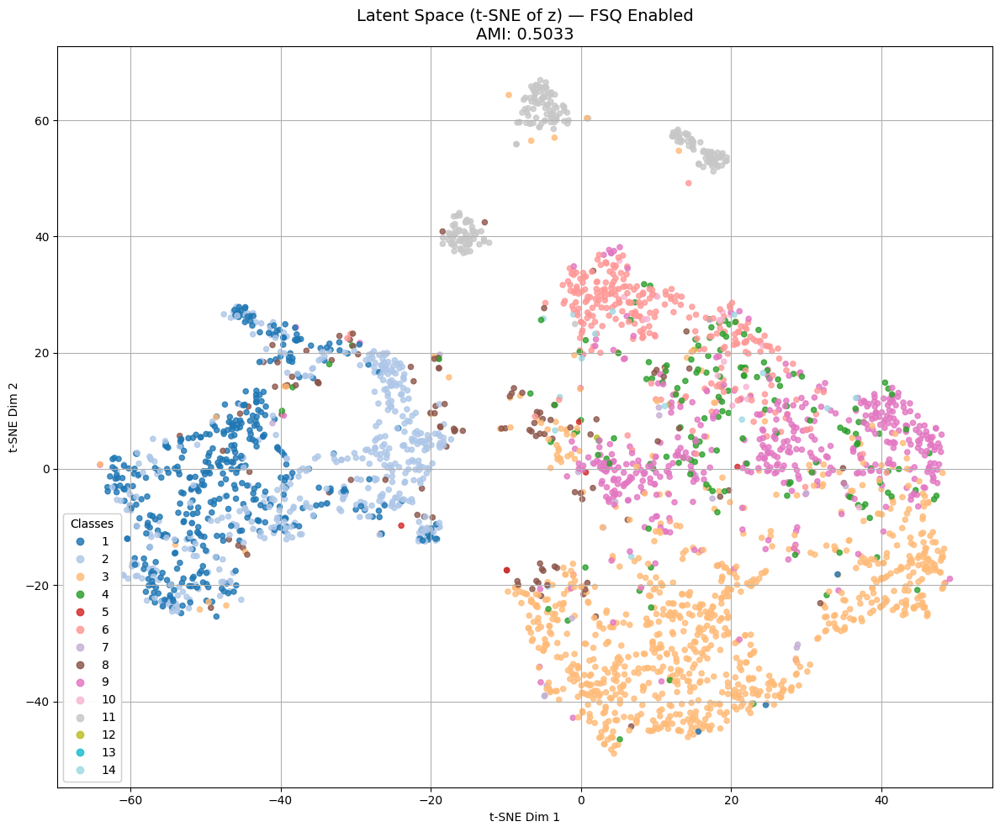

plot_latent_space finished.


In [18]:
#@title Plot latents

sample_and_display(
            vae, test_dataset, valid_dataset, device,
            num_samples=3, epoch=299,
            train_loss=0, test_loss=0
        )